In [95]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.pyplot import figure
from folium import plugins
import folium
from folium.plugins import HeatMap
import geopandas as gpd
import json
from shapely.geometry import MultiPolygon

In [96]:
n = 10  # every 100th line = 1% of the lines
df18 = pd.read_csv("On-street_Car_Parking_Sensor_Data_-_2019.csv",skiprows=lambda i: i % n != 0 )
#senSensorData = pd.read_csv("On-street_Parking_Bay_Sensors.csv")  

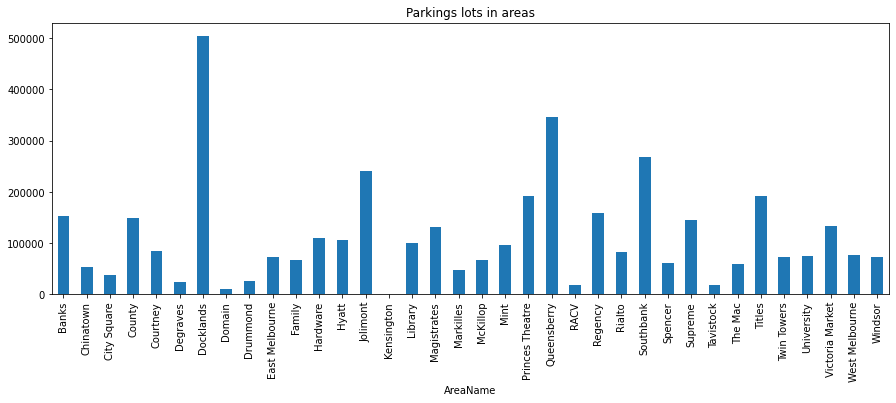

In [97]:
parkingsSpots = df18[['AreaName', 'DeviceId']].dropna()
parkingsSpots = parkingsSpots[parkingsSpots['AreaName']!='All']
spotsInArea =  parkingsSpots['DeviceId'].groupby(parkingsSpots['AreaName']).size()
spotsInArea
figure(figsize= (15,5))
spotsInArea.plot(kind = 'bar', title = "Parkings lots in areas",sharex='True', fig=figure)
plt.show()

#hourData = data[(data['Category'] == 'LARCENY/THEFT') &
#                (pd.to_datetime((data['Time']), format="%H:%M").dt.hour == 19) &
#                (data['Date'].dt.year == 2014) &
#                (data['Date'].dt.month < 6)].sort_values('Time')
#drugdata = data[(data['Category'] == 'DRUG/NARCOTIC') & (data['Date'].dt.year == 2016) & (data['Date'].dt.month >= 6) & (data['Date'].dt.month <=7)]

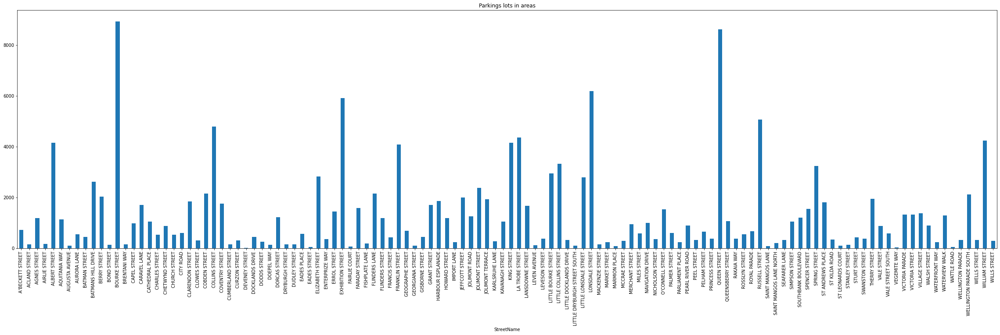

In [98]:
vialationsOnStreets = df18[df18['InViolation']==True].groupby(df18["StreetName"]).size()
vialationsOnStreets
figure(figsize= (40,10))
vialationsOnStreets.plot(kind = 'bar', title = "Parkings lots in areas",sharex='True', fig=figure)
plt.show()

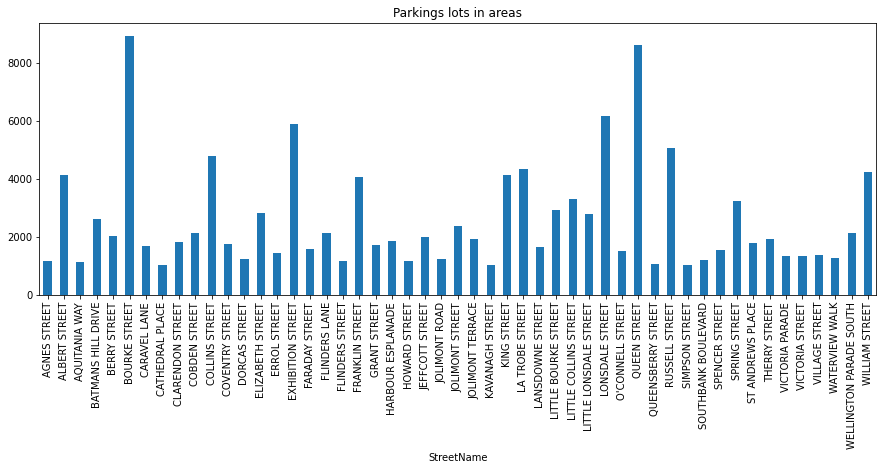

In [99]:
vialationsOnStreetsFilter = df18[df18['InViolation']==True].groupby(df18["StreetName"]).size()
vialationsOnStreetsFilter

vialationsOnStreetsFilter = vialationsOnStreetsFilter[vialationsOnStreetsFilter.values > 1000]

figure(figsize= (15,5))
vialationsOnStreetsFilter.plot(kind = 'bar', title = "Parkings lots in areas",sharex='True', fig=figure)
plt.show()

In [100]:
spotTaken = df18[ 'VehiclePresent']
spotTaken = spotTaken.to_frame()
print(df18['ArrivalTime'])

0          09/20/2019 07:42:35 AM
1          10/06/2019 03:00:15 AM
2          06/20/2019 11:56:18 AM
3          07/02/2019 10:33:39 AM
4          10/02/2019 06:41:28 AM
                    ...          
4267269    10/29/2019 10:11:06 AM
4267270    06/07/2019 03:43:09 PM
4267271    10/06/2019 10:07:25 PM
4267272    12/20/2019 11:43:17 AM
4267273    10/18/2019 07:34:45 AM
Name: ArrivalTime, Length: 4267274, dtype: object


In [101]:
df18['ArrivalTime'] = pd.to_datetime(df18['ArrivalTime'], format="%m/%d/%Y %I:%M:%S %p")
df18['DepartureTime'] = pd.to_datetime(df18['DepartureTime'], format="%m/%d/%Y %I:%M:%S %p")

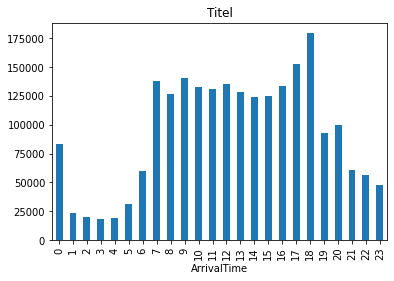

In [102]:
spotTakenDf = df18

crime = spotTakenDf[spotTakenDf['VehiclePresent'] == True].groupby(spotTakenDf['ArrivalTime'].dt.hour).size()
crime.plot(kind = 'bar', title = "Titel",sharex='True')
plt.show()

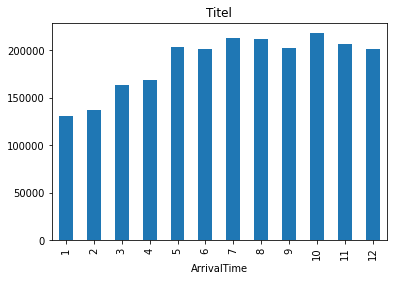

In [103]:
spotTakenDf = df18

crime = spotTakenDf[spotTakenDf['VehiclePresent'] == True].groupby(spotTakenDf['ArrivalTime'].dt.month).size()
crime.plot(kind = 'bar', title = "Titel",sharex='True')
plt.show()

In [104]:
spotTakenDf['count'] = 0
spotTakenDf['ArrivalHour'] = spotTakenDf['ArrivalTime'].dt.hour
spotsInArea =  spotTakenDf[spotTakenDf['VehiclePresent'] == False].groupby(['AreaName', 'ArrivalHour'])['count'].size()
spotsInArea = spotsInArea.reset_index()
spotTakenDf['total'] = 0
spotsInAreaTotal =  spotTakenDf[spotTakenDf['VehiclePresent'] == False].groupby(['AreaName'])['total'].size()
spotsInAreaTotal = spotsInAreaTotal.reset_index()
merged = pd.merge(spotsInAreaTotal, spotsInArea, on='AreaName')
merged['mean'] = merged['total'] / merged['count']
merged = merged[merged['AreaName'] != 'All']
merged['mean'] = merged['mean'].apply(np.ceil)
merged['mean'] = merged['mean'].astype(int)
merged

,AreaName,total,ArrivalHour,count,mean
24,Banks,61033,0,1982,31
25,Banks,61033,1,781,79
26,Banks,61033,2,654,94
27,Banks,61033,3,696,88
28,Banks,61033,4,625,98
...,...,...,...,...,...
866,Windsor,32917,19,923,36
867,Windsor,32917,20,1068,31
868,Windsor,32917,21,1063,31
869,Windsor,32917,22,1282,26


In [105]:
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.models import ColumnDataSource, FactorRange, Legend

In [106]:
focusCrimes = set(['Library', 'All', 'Regency', 'Queensberry', 'The Mac', 'Princes Theatre', 'Courtney', 'Drummond', 'Hardware', 'Supreme', 'City Square', 'Domain', 'McKillop', 'Tavistock', 'Degraves', 'Markilles', 'Southbank', 'West Melbourne', 'Victoria Market', 'East Melbourne', 'Spencer', 'Jolimont', 'Docklands', 'Mint', 'Family', 'Twin Towers', 'Hyatt', 'Titles', 'Chinatown', 'County', 'Kensington', 'Windsor', 'Magistrates', 'University', 'Rialto', 'Banks'])
#print(focusCrimes)
dailyHours = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]
df18['Hours'] = df18['ArrivalTime'].dt.hour
normalizedData = pd.DataFrame(dailyHours, columns = ['Hours'])
for index, row in merged.iterrows():
    for i in focusCrimes:  
        dailyHoursArray = []
        for t in range(0,24):
            dailyHoursArray.append(merged.loc[(merged['AreaName'] == i) &(merged['ArrivalHour'] == t), 'count']/merged.loc[(merged['AreaName'] == i )&(merged['ArrivalHour']==t), 'total'])
        normalizedData[i] = dailyHoursArray
    
#print(merged.loc[merged['AreaName'] == 'Banks', 'count'])
normalizedData
    

KeyboardInterrupt: 

In [107]:
hoursStrings=['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20','21','22','23']
p = figure(x_range = FactorRange(factors=hoursStrings), x_axis_label = "hour of the day", width = 1500, margin = 10)

In [320]:
colorCodes= ['#ff0000', '#ff5e00', '#ffd900', '#c8ff00', '#3cff00', '#00ffb7', '#00eaff', '#005eff', '#7300ff', '#d000ff', '#ff00f7', '#ff006f', '#828282', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000', '#000000']
barColumn = {}
items = []
print(focusCrimes)

for index, i in enumerate(focusCrimes):
    barColumn[i] = p.vbar(x="Hours", top = i, source = sourceData, muted_alpha= 0.05, muted=True, fill_color=colorCodes[index], width=(0.90))
    items.append((i,[barColumn[i]]))
items

{'Library', 'All', 'Regency', 'Queensberry', 'The Mac', 'Princes Theatre', 'Courtney', 'Drummond', 'Hardware', 'Supreme', 'City Square', 'Domain', 'McKillop', 'Tavistock', 'Degraves', 'Markilles', 'Southbank', 'West Melbourne', 'Victoria Market', 'East Melbourne', 'Spencer', 'Jolimont', 'Docklands', 'Mint', 'Family', 'Twin Towers', 'Hyatt', 'Titles', 'Chinatown', 'County', 'Kensington', 'Windsor', 'Magistrates', 'RACV', 'University', 'Rialto', 'Banks'}


[('Library', [GlyphRenderer(id='3310', ...)]),
 ('All', [GlyphRenderer(id='3316', ...)]),
 ('Regency', [GlyphRenderer(id='3322', ...)]),
 ('Queensberry', [GlyphRenderer(id='3328', ...)]),
 ('The Mac', [GlyphRenderer(id='3334', ...)]),
 ('Princes Theatre', [GlyphRenderer(id='3340', ...)]),
 ('Courtney', [GlyphRenderer(id='3346', ...)]),
 ('Drummond', [GlyphRenderer(id='3352', ...)]),
 ('Hardware', [GlyphRenderer(id='3358', ...)]),
 ('Supreme', [GlyphRenderer(id='3364', ...)]),
 ('City Square', [GlyphRenderer(id='3370', ...)]),
 ('Domain', [GlyphRenderer(id='3376', ...)]),
 ('McKillop', [GlyphRenderer(id='3382', ...)]),
 ('Tavistock', [GlyphRenderer(id='3388', ...)]),
 ('Degraves', [GlyphRenderer(id='3394', ...)]),
 ('Markilles', [GlyphRenderer(id='3400', ...)]),
 ('Southbank', [GlyphRenderer(id='3406', ...)]),
 ('West Melbourne', [GlyphRenderer(id='3412', ...)]),
 ('Victoria Market', [GlyphRenderer(id='3418', ...)]),
 ('East Melbourne', [GlyphRenderer(id='3424', ...)]),
 ('Spencer', [Gl

In [321]:
legend = Legend(items = items, location=(0,-30))
p.add_layout(legend, 'left')
p.legend.click_policy="mute"
show(p)

ERROR:bokeh.core.validation.check:E-1001 (BAD_COLUMN_NAME): Glyph refers to nonexistent column name. This could either be due to a misspelling or typo, or due to an expected column being missing. : key "top" value "All", key "x" value "Hours" [renderer: GlyphRenderer(id='3094', ...)]
ERROR:bokeh.core.validation.check:E-1001 (BAD_COLUMN_NAME): Glyph refers to nonexistent column name. This could either be due to a misspelling or typo, or due to an expected column being missing. : key "top" value "All", key "x" value "Hours" [renderer: GlyphRenderer(id='3316', ...)]
ERROR:bokeh.core.validation.check:E-1001 (BAD_COLUMN_NAME): Glyph refers to nonexistent column name. This could either be due to a misspelling or typo, or due to an expected column being missing. : key "top" value "Banks", key "x" value "Hours" [renderer: GlyphRenderer(id='3304', ...)]
ERROR:bokeh.core.validation.check:E-1001 (BAD_COLUMN_NAME): Glyph refers to nonexistent column name. This could either be due to a misspelling 

ERROR:bokeh.core.validation.check:E-1001 (BAD_COLUMN_NAME): Glyph refers to nonexistent column name. This could either be due to a misspelling or typo, or due to an expected column being missing. : key "top" value "Jolimont", key "x" value "Hours" [renderer: GlyphRenderer(id='3214', ...)]
ERROR:bokeh.core.validation.check:E-1001 (BAD_COLUMN_NAME): Glyph refers to nonexistent column name. This could either be due to a misspelling or typo, or due to an expected column being missing. : key "top" value "Jolimont", key "x" value "Hours" [renderer: GlyphRenderer(id='3436', ...)]
ERROR:bokeh.core.validation.check:E-1001 (BAD_COLUMN_NAME): Glyph refers to nonexistent column name. This could either be due to a misspelling or typo, or due to an expected column being missing. : key "top" value "Kensington", key "x" value "Hours" [renderer: GlyphRenderer(id='3268', ...)]
ERROR:bokeh.core.validation.check:E-1001 (BAD_COLUMN_NAME): Glyph refers to nonexistent column name. This could either be due to

ERROR:bokeh.core.validation.check:E-1001 (BAD_COLUMN_NAME): Glyph refers to nonexistent column name. This could either be due to a misspelling or typo, or due to an expected column being missing. : key "top" value "Supreme", key "x" value "Hours" [renderer: GlyphRenderer(id='3364', ...)]
ERROR:bokeh.core.validation.check:E-1001 (BAD_COLUMN_NAME): Glyph refers to nonexistent column name. This could either be due to a misspelling or typo, or due to an expected column being missing. : key "top" value "Tavistock", key "x" value "Hours" [renderer: GlyphRenderer(id='3166', ...)]
ERROR:bokeh.core.validation.check:E-1001 (BAD_COLUMN_NAME): Glyph refers to nonexistent column name. This could either be due to a misspelling or typo, or due to an expected column being missing. : key "top" value "Tavistock", key "x" value "Hours" [renderer: GlyphRenderer(id='3388', ...)]
ERROR:bokeh.core.validation.check:E-1001 (BAD_COLUMN_NAME): Glyph refers to nonexistent column name. This could either be due to 

In [108]:
vialationsOnStreets = df18[df18['InViolation']==True].groupby(df18["StreetName"]).size()
vialationsOnStreets

StreetName
A'BECKETT STREET            709
ACLAND STREET               139
AGNES STREET               1175
AIRLIE STREET               165
ALBERT STREET              4146
                           ... 
WELLINGTON PARADE           317
WELLINGTON PARADE SOUTH    2119
WELLS STREET                314
WILLIAM STREET             4234
WILLS STREET                284
Length: 122, dtype: int64

In [109]:
vialationsOnStreetsFilter2 = df18[df18['InViolation']==True].groupby(df18["StreetMarker"]).size()
vialationsOnStreetsFilter2 = vialationsOnStreetsFilter2[vialationsOnStreetsFilter2.values > 5]
#print(vialationsOnStreetsFilter2)



In [113]:
geoFile = open("On-street Parking Bays.geojson")
geoData = json.load(geoFile)
dfGeo = pd.json_normalize(geoData['features'])
dfGeo = dfGeo.dropna()
senSensorData.rename(columns = {"st_marker_id": "StreetMarker"}, 
          inplace = True)
print(senSensorData)




NameError: name 'senSensorData' is not defined

In [111]:
resultdf = pd.merge(df18, senSensorData, on='StreetMarker')
resultdf
resultdf['ArrivalTime'].dt.hour


NameError: name 'senSensorData' is not defined

In [86]:
resultdfInViolation = resultdf[resultdf['InViolation'] == True].sample(10000)

HeatViolation = folium.Map([-37.810935, 144.946457], zoom_start=13)
locationdata = [[row['lat'],row['lon']] for index, row in resultdfInViolation.iterrows()]
HeatMap(locationdata, radius = 20, max_zoom=5).add_to(HeatViolation)

HeatViolation

In [94]:
resultdfsample = resultdf.sample(10000)
heatsus = [[[row['lat'],row['lon']] for index, row in resultdfsample[(resultdfsample['ArrivalTime'].dt.hour == i) & (resultdfsample['VehiclePresent']==False)].iterrows()] for i in range(1,24)]

NameError: name 'resultdf' is not defined

In [88]:
SFmap = folium.Map([-37.810935, 144.946457], zoom_start=13)
hm = plugins.HeatMapWithTime(heatsus,auto_play=True, max_opacity = 0.8)
hm.add_to(SFmap)
SFmap

In [25]:
resultdf['marker_color'] = pd.cut((resultdf['VehiclePresent']  == True) & (resultdf['InViolation']  == True), bins=2,                              
                                       labels=[ 'green','red'])

m = folium.Map(
    location=[-37.810935, 144.946457],
    tiles="cartodbpositron",
    zoom_start=13,
)

resultdfsample = resultdf.sample(20000)
for index, row in resultdfsample.iterrows():
       folium.CircleMarker([row['lat'], row['lon']],  radius=2, color=row['marker_color']).add_to(m)
        
m

In [64]:
map = folium.Map(
    location=[-37.810935, 144.946457],
    tiles="cartodbpositron",
    zoom_start=13,
)

for _, r in dfGeo.iterrows():
    #without simplifying the representation of each borough, the map might not be displayed
    #sim_geo = gpd.GeoSeries(r['geometry'])
    sim_geo = gpd.GeoSeries(r[['geometry.type' ,'geometry.coordinates']])
    print(sim_geo)
    geo_j = sim_geo.to_json()
    print(geo_j)
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'orange'})
    folium.Popup(r['BoroName']).add_to(geo_j)
    geo_j.add_to(m)
map

geometry.type                                                MultiPolygon
geometry.coordinates    [[[[144.973757892572, -37.809439811054], [144....
Name: 21, dtype: object
{"geometry.type":"MultiPolygon","geometry.coordinates":[[[[144.9737578926,-37.8094398111],[144.9737622862,-37.8094180763],[144.9737970366,-37.8094219618],[144.9738295327,-37.8094255399],[144.9738263643,-37.8094474147],[144.9737578926,-37.8094398111]]]]}


/usr/lib/python3/dist-packages/ipykernel_launcher.py:10: FutureWarning:     You are passing non-geometry data to the GeoSeries constructor. Currently,
    it falls back to returning a pandas Series. But in the future, we will start
    to raise a TypeError instead.
  # Remove the CWD from sys.path while we load stuff.


KeyError: 'type'

In [ ]:
#senSensorData['marker_color'] = pd.cut(df18['InViolation'], bins=2,                              labels=[ 'green','red'])
#for index, row in sensorMapData.iterrows():
#    folium.CircleMarker(row['lat'], row['lon'],  radius=5, color=row['marker_color']).add_to(m)